<a href="https://colab.research.google.com/github/Laurentiu1802/dog-breed-classification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 3. Evalation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images ( unstructured data ) so it's probably best we use deep learning / transfer learning
* There are 120 breeds of dogs ( this means there are 120 different classes).
* There are around 10.000+ items in the training set (these images have labels).
* There are around 10.000+ items in the test set (these images have no labels, because we'll want to predict them).


In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Get our workspace ready

* Import Tensforflow 2.17 ✅
* Import Tensforflow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU","available (Yessss)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.17.0
TF Hub version: 0.16.1
GPU available (Yessss)


## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start by accessing the data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

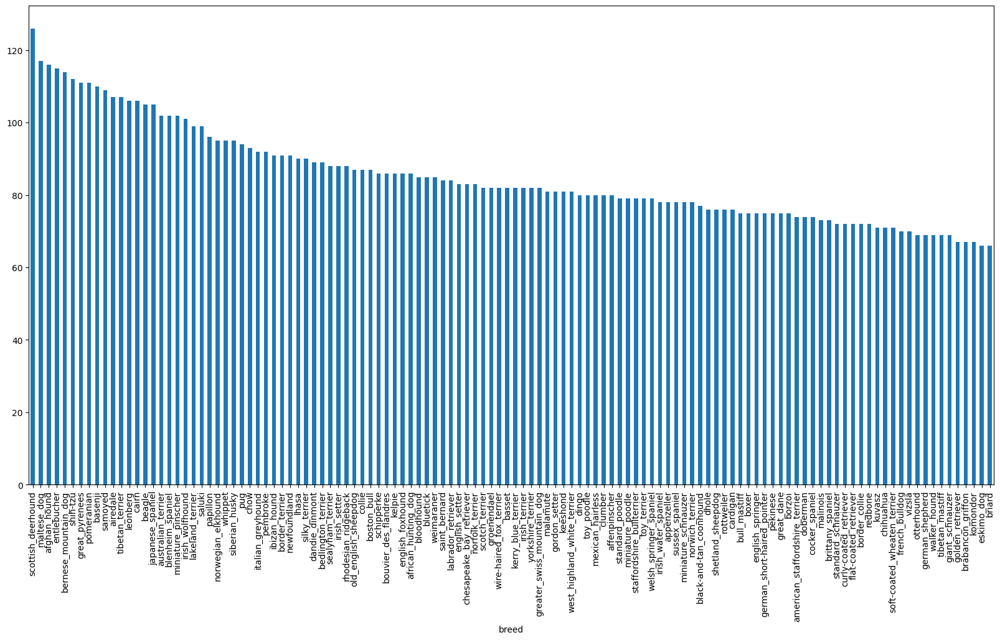

In [ ]:
# How many images are there of each breed ?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

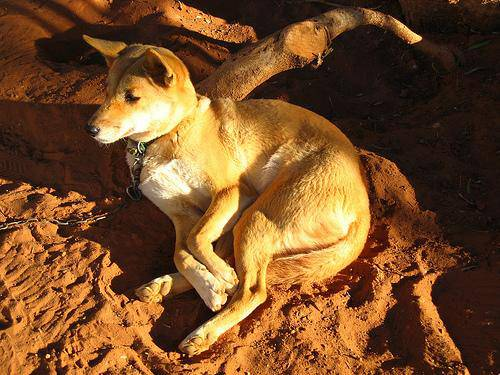

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames for image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files.
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files. Check the target directory.")

Filenames match actual amount of files!!! Proceed.


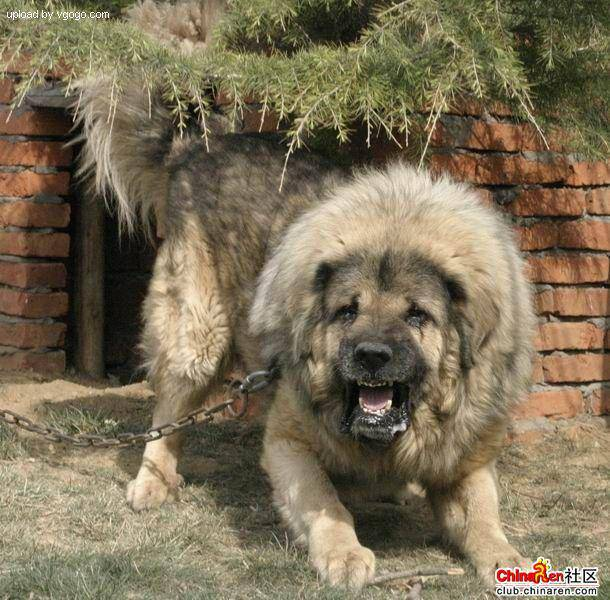

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare the labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames. Check data import.")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds= np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create or own.

In [ ]:
# Setup X and y variables
X = filenames
y= boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experiments
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
# Let's split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [ ]:
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:2],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as an input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

Before we do let's see what importing an image looks like.

In [ ]:
# Convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like in a tensor let's make a function to preprocess them.

In [ ]:
# Define the image size
IMG_SIZE=224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a tensor.
  """
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn jpg images into numerical tensors with 3 colour channels ( Red, Green , Blue )
  image = tf.image.decode_jpeg(image,channels = 3 )
  # Convert the colour channel values from 0 to 255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches ?

Let's say tou're trying to process 10.000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (batch size) images at a time ( you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which looks like this `(image,label)`.

In [ ]:
# Create a simple function to return a tuple of tensore (image,label).
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image de returns a tuple of (image,label).
  """
  image = process_image(image_path)
  return image,label

In [ ]:
# Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form `(image,label)`, let's make a function to turn all of ou data (`X` and `y`) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples ( this also turns the image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch (batch_size)

    return data_batch

In [ ]:
# Creating and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data= create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 for displaing 25 images
  for i in range(25):
    # Create subplots (5 rows,5 columns)
    ax= plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[6.44863069e-01, 6.25255227e-01, 6.04737043e-01],
          [9.17616129e-01, 9.01334584e-01, 8.61173511e-01],
          [9.23774600e-01, 9.11379635e-01, 8.44082713e-01],
          ...,
          [9.43161488e-01, 9.96240258e-01, 9.98177230e-01],
          [9.68627512e-01, 9.87640083e-01, 9.99404728e-01],
          [9.63200271e-01, 9.78886545e-01, 9.90651250e-01]],
 
         [[6.36794984e-01, 6.17187142e-01, 5.96668959e-01],
          [9.22561049e-01, 9.06279504e-01, 8.66118431e-01],
          [9.26176965e-01, 9.13782001e-01, 8.46485078e-01],
          ...,
          [9.63416755e-01, 9.87406194e-01, 9.90183473e-01],
          [9.71055388e-01, 9.87640083e-01, 9.99404728e-01],
          [9.63200271e-01, 9.78886545e-01, 9.90651250e-01]],
 
         [[6.33954883e-01, 6.14347041e-01, 5.93828857e-01],
          [9.24437463e-01, 9.08155918e-01, 8.67994845e-01],
          [9.27065909e-01, 9.14670944e-01, 8.47374022e-01],
          ...,
          [9.87710118e-01, 9.74772453e-01, 9.7869

In [ ]:
len(train_images),len(train_labels)

(32, 32)

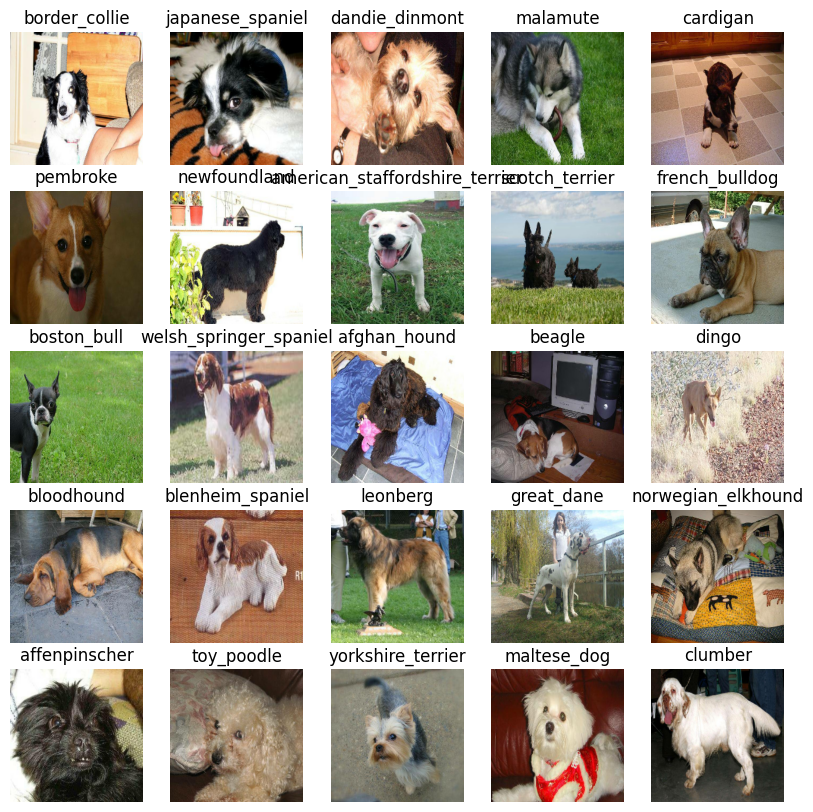

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images,train_labels)

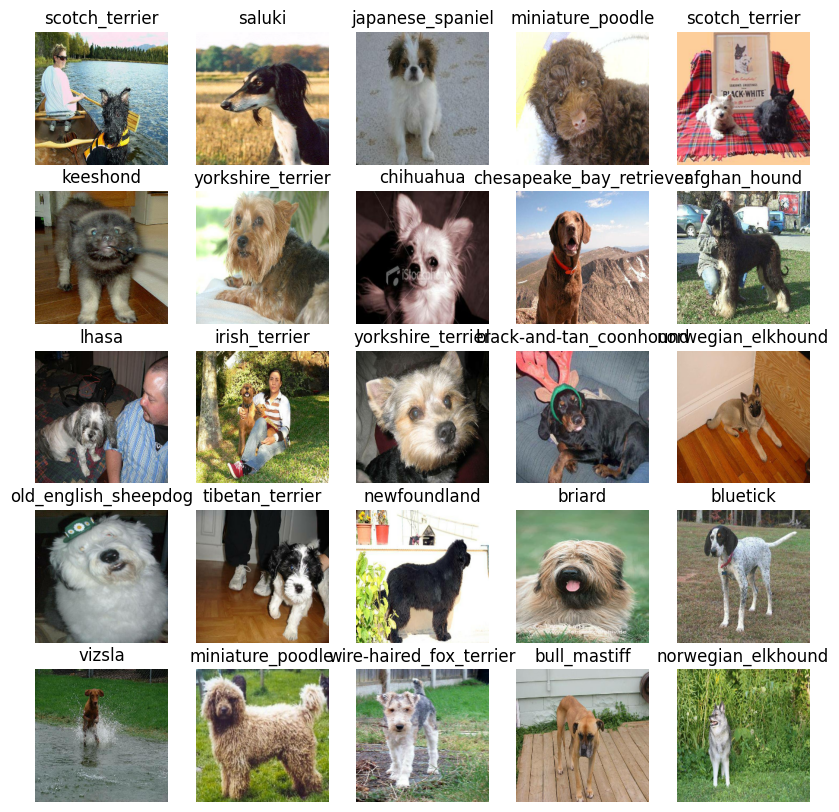

In [ ]:
# Now let's visualize our validation set
val_images,val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

 ## Building a model

 Before we build a model , there are a few things we need to define:
 * The input shape (our images shape, in the form of Tensors) to our model.
 * The output shape (image labels, in the form of Tensors) of our model.
 * The URL of the model we want to use from Kaggle.
 https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE,3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we've got our inputs, outputs and model ready to go, let's put them together into a Keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model ( says it should be evaluated and improved).
* Returns the model.

In [ ]:
from keras import layers
# Create a function which builds a Keras model
def create_model():
  print("Building model with:",MODEL_URL)

  base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(include_top = False,
                                                     classes = len(unique_breeds))
  base_model.trainable = False

  inputs = layers.Input(shape = (224,224,3))
  x = base_model(inputs, training = False)
  x = tf.keras.layers.GlobalAveragePooling2D(name= "global_average_pooling")(x)
  x = layers.Dropout(0.2)(x)
  outputs = tf.keras.layers.Dense(len(unique_breeds), activation="softmax")(x)


  ModelDogBreed = tf.keras.Model(inputs, outputs)

  ModelDogBreed.compile(loss = "categorical_crossentropy",
                         optimizer = tf.keras.optimizers.Adam(),
                         metrics=["accuracy"])

  return ModelDogBreed

model = create_model()
model.summary()


Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


<ipython-input-39-0067c182ddd1>:6: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(include_top = False,


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling               │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stop improving.

We'll create two callbacks, one for TensorBoard which heps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Creat a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensowboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evalouation metric stop improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training a model ( on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCS = 100 #@param {type:"slider", min:10,max:100,step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU","available (YESSSSS)" if tf.config.list_physical_devices("GPU") else "not avaiable")

GPU available (YESSSSS)


create a function which trains a model.

* Create a model using `create_model()`
* Setup TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` funcion on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,epochs = NUM_EPOCS,validation_data=val_data,validation_freq=1,callbacks = [tensorboard,early_stopping] )

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


<ipython-input-39-0067c182ddd1>:6: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(include_top = False,


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 238s 8s/step - accuracy: 0.0329 - loss: 4.9980 - val_accuracy: 0.2300 - val_loss: 3.6400
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - accuracy: 0.5180 - loss: 2.4499 - val_accuracy: 0.4400 - val_loss: 2.5099
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 218ms/step - accuracy: 0.8442 - loss: 1.2032 - val_accuracy: 0.5400 - val_loss: 1.9913
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - accuracy: 0.9429 - loss: 0.6261 - val_accuracy: 0.6050 - val_loss: 1.7673
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - accuracy: 0.9612 - loss: 0.4083 - val_accuracy: 0.6200 - val_loss: 1.6377
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 221ms/step - accuracy: 0.9959 - loss: 0.2654 - val_accuracy: 0.6100 - val_loss: 1.5982
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step - accuracy: 0.9999 - loss: 0.1928 - val_accuracy: 0.6200 - val_loss: 1.5485
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 167ms/step - accuracy: 0.9999 - loss: 0.1539 - val_accu

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose =1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 265s 41s/step


array([[0.00225583, 0.04266649, 0.01018447, ..., 0.01103633, 0.00399873,
        0.01486489],
       [0.00259024, 0.03153893, 0.00289181, ..., 0.00236931, 0.06199383,
        0.00501861],
       [0.00562065, 0.01445842, 0.00958585, ..., 0.0049656 , 0.00953237,
        0.00321687],
       ...,
       [0.00381039, 0.0105179 , 0.00751575, ..., 0.00370296, 0.00985149,
        0.00671177],
       [0.0025137 , 0.027926  , 0.02215599, ..., 0.00503665, 0.00151869,
        0.01170387],
       [0.00537577, 0.00257575, 0.04505341, ..., 0.00133638, 0.00801323,
        0.00460821]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 42
print(predictions[0])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])} ")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[0.00225583 0.04266649 0.01018447 0.00112332 0.00219623 0.01568698
 0.00311159 0.00635294 0.01407509 0.00445652 0.00530143 0.00907603
 0.00283647 0.00219568 0.00600163 0.00815662 0.02110287 0.00992998
 0.00926888 0.00743038 0.00181099 0.00723263 0.00379304 0.00459533
 0.00290304 0.00275036 0.00475531 0.00586986 0.01101235 0.00527697
 0.00118516 0.00177769 0.00250038 0.00239261 0.00936582 0.00809006
 0.00989292 0.00352263 0.00688354 0.01321737 0.01448249 0.00761795
 0.00485813 0.0069485  0.00369305 0.00469002 0.00220797 0.00596367
 0.03863031 0.00339383 0.03340282 0.00645661 0.00210325 0.00069565
 0.0150194  0.00340161 0.00689283 0.00434175 0.00335466 0.00517198
 0.01063655 0.00625063 0.01290174 0.00226843 0.00903619 0.00576431
 0.00899477 0.00820229 0.00829429 0.02020718 0.02536171 0.00632219
 0.01386748 0.00785846 0.01281656 0.00411815 0.0063672  0.01034396
 0.00886146 0.00652941 0.00472548 0.00785186 0.00871791 0.00237282
 0.0084835  0.00455995 0.00307864 0.00659857 0.00373811 0.0024

Do the above functionality at scale and also see the image the prediction is being made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction proababilities
pred_label = get_pred_label(predictions[81])
pred_label

'standard_poodle'

Since our data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels( truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (image,label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

# Unbatchify the validation data

val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

Create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depepending on if the prediction is right or wrong
  if pred_label == true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted, probability of prediction and truth
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

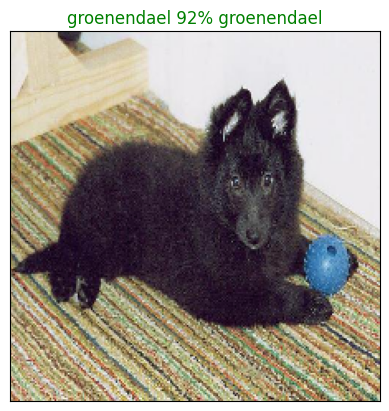

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 prediction

This function will:
* Take an input of prediction proabilities array and a ground truth array and an integer ✅
* Find the top 10:
  * Prediction probabilities indexes✅
  * Prediction proababilities values✅
  * Prediction labels✅
* Plot the top 10 prediction proabability values and labels,coloring the true label green✅

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob,true_label = prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels, rotation= "vertical")

  # Change the color of the true labels
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

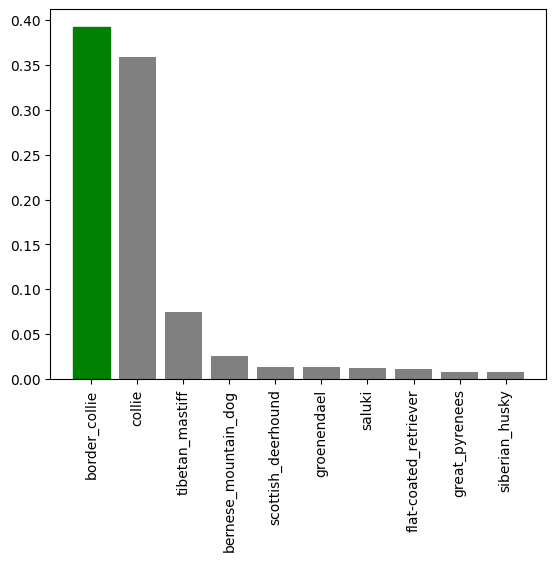

In [ ]:
plot_pred_conf(prediction_probabilities = predictions , labels = val_labels,n=9)

Now we've got some function to help us visualize our pedictions and evaluate ur model let's check out a few.

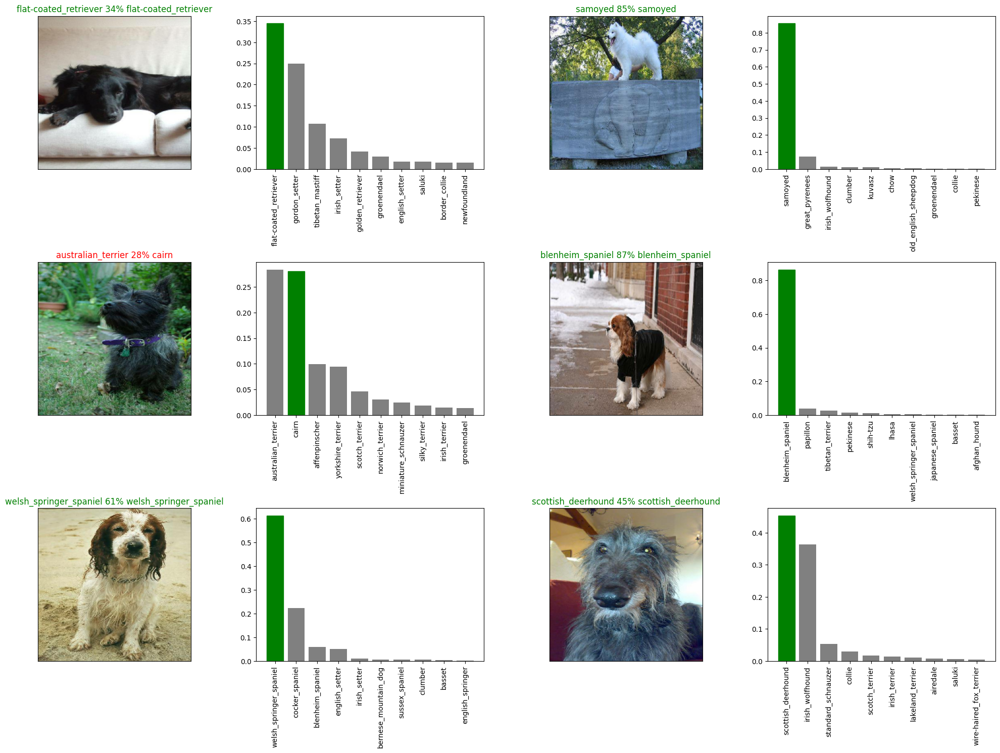

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels = val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time.
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir+"-"+suffix+".h5" # save format model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240819-16251724084721-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240819-16251724084721-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20240818-17311724002297-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20240818-17311724002297-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - accuracy: 0.6790 - loss: 1.3881


[1.4663580656051636, 0.6449999809265137]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 306ms/step - accuracy: 0.5897 - loss: 1.5004


[1.5431866645812988, 0.5799999833106995]

# Training a big model 🐶 (on the full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


<ipython-input-39-0067c182ddd1>:6: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(include_top = False,


In [ ]:
# Create full model callbacks
full_model_tensorboard= create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience = 3)


**Note:** Running the cell below will take a little while(maybe up to 30 minutes for the first epoch) because the GPU we're using has to load all of the images into memory.

In [ ]:
# Fit the model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCS,
               callbacks= [full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - accuracy: 0.4066 - loss: 2.6618
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 74s 132ms/step - accuracy: 0.8063 - loss: 0.6520
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 136ms/step - accuracy: 0.8729 - loss: 0.4491
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 135ms/step - accuracy: 0.9134 - loss: 0.3236
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 130ms/step - accuracy: 0.9322 - loss: 0.2574
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - accuracy: 0.9477 - loss: 0.2108
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 139ms/step - accuracy: 0.9681 - loss: 0.1572
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - accuracy: 0.9691 - loss: 0.1405
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - accuracy: 0.9818 - loss: 0.1092
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - accuracy: 0.9843 - loss: 0.0934
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 139ms/step - accuracy: 0.9854 - loss: 0.0867
Epoch 12

In [ ]:
save_model(full_model,suffix="all-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240819-17081724087338-all-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240819-17081724087338-all-images-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20240819-17081724087338-all-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20240819-17081724087338-all-images-mobilenetv2-Adam.h5...


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches

To make predictions on the test date, we'll:
* Get the test image filenames ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` ( since the test data doesn't have labels) ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e0eea374c5170e90dc0b1ee795470ca6.jpg',
 'drive/MyDrive/Dog Vision/test/e29f03a924c493b29d17877204dd0205.jpg',
 'drive/MyDrive/Dog Vision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/Dog Vision/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 'drive/MyDrive/Dog Vision/test/e3cec8d0c1876ac36942d35f64b9dfa0.jpg',
 'drive/MyDrive/Dog Vision/test/e01b6b1e7cef1d9abdfbeb4afb88379f.jpg',
 'drive/MyDrive/Dog Vision/test/e4d878f113883a3caab47d3126d2c2a4.jpg',
 'drive/MyDrive/Dog Vision/test/e59d59ffbb65d9eae166d4068af5d9b9.jpg',
 'drive/MyDrive/Dog Vision/test/e292584f17fa7cea7f95bdadecde0ebb.jpg',
 'drive/MyDrive/Dog Vision/test/e09859cae41cb59228518c09c3b27362.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**: Calling `predict()` on our full model and passing it the test data batch will take a long time to run.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 299s 903ms/step


In [ ]:
# Save predictions (NumPy Array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions to Kaggle

Looking at the Kaggle submission, we find that it wants our models prediction probability in a DataFrame with an ID and a column for each different dog breed.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns.
preds_df = pd.DataFrame(columns=["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0eea374c5170e90dc0b1ee795470ca6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e29f03a924c493b29d17877204dd0205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7feb64da6aae1ef8e62453f6660d0c5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e427b9e1ab1b7f09cfb02ac073f56f2d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e3cec8d0c1876ac36942d35f64b9dfa0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probbilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0eea374c5170e90dc0b1ee795470ca6,4.511608e-07,3.063982e-09,3.470647e-10,7.714770e-08,8.392024e-09,4.947136e-09,1.588372e-05,4.581853e-08,3.283964e-09,...,4.898302e-01,1.054838e-05,2.137587e-11,1.742630e-09,9.892656e-09,2.026451e-09,3.354882e-03,1.151139e-09,1.356806e-05,2.209146e-07
1,e29f03a924c493b29d17877204dd0205,2.745578e-10,7.967179e-05,2.335526e-10,1.555047e-08,4.700778e-11,4.466723e-11,8.187712e-12,9.890805e-11,2.057826e-10,...,1.417226e-05,6.542871e-12,7.258218e-11,1.344331e-12,1.308578e-10,4.727017e-10,1.781079e-08,8.809570e-08,2.471949e-04,2.223281e-09
2,e7feb64da6aae1ef8e62453f6660d0c5,8.469763e-09,3.335282e-06,7.474160e-11,2.256338e-12,4.811637e-11,7.108138e-12,1.230858e-09,6.098592e-11,1.119186e-09,...,3.607873e-07,1.198354e-10,5.622198e-11,8.926015e-12,2.404142e-12,1.743812e-09,4.673208e-10,9.584797e-10,1.565600e-11,1.575306e-06
3,e427b9e1ab1b7f09cfb02ac073f56f2d,6.331877e-11,2.288646e-09,2.758783e-12,2.934943e-06,2.134757e-07,2.433089e-09,2.252095e-08,1.378531e-08,9.290762e-09,...,3.192078e-10,1.056961e-06,1.774359e-11,4.406673e-08,3.364364e-13,4.899094e-08,1.807439e-09,1.472570e-07,9.223617e-01,7.478787e-10
4,e3cec8d0c1876ac36942d35f64b9dfa0,4.996607e-12,1.069190e-17,3.193671e-12,4.189754e-12,5.299947e-03,4.963814e-09,3.701686e-12,1.774137e-10,4.572956e-14,...,1.441837e-11,1.501079e-10,6.570732e-09,2.089502e-11,8.253858e-10,4.502926e-14,1.557051e-11,2.566646e-09,1.564909e-10,1.869944e-11


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths= [custom_path+fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/dog-animal_DOTORLBDD7.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/201030094143-stock-rhodesian-ridgeback.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/img_article-head_bringing-new-dog-home-r1.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['dingo', 'rhodesian_ridgeback', 'airedale']

In [ ]:
# Get custom images ( our unbatchify function won't work sincer there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

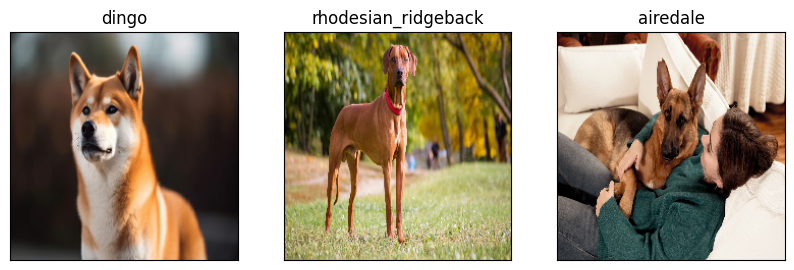

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)